## Feature Description of Aerial dataset

In [19]:
import os
import numpy as np
import tifffile as tiff
import cv2
import matplotlib.pyplot as plt

#### RGB using M bands

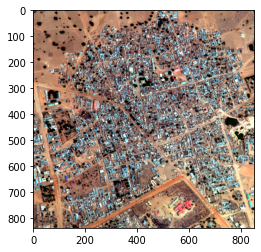

In [25]:
def stretch_8bit(bands, lower_percent=2, higher_percent=98):
    out = np.zeros_like(bands)
    for i in range(3):
        a = 0 
        b = 255 
        c = np.percentile(bands[:,:,i], lower_percent)
        d = np.percentile(bands[:,:,i], higher_percent)        
        t = a + (bands[:,:,i] - c) * (b - a) / (d - c)    
        t[t<a] = a
        t[t>b] = b
        out[:,:,i] =t
    return out.astype(np.uint8)    
    
def M(image_id):
    filename = os.path.join('/content/Data-set/sixteen_band','{}_M.tif'.format(image_id))
    img = tiff.imread(filename)    
    img = np.rollaxis(img, 0, 3)
    return img

image_id = '6120_2_2'
m = M(image_id)
img = np.zeros((837,851,3))
img[:,:,0] = m[:,:,4] #red
img[:,:,1] = m[:,:,2] #green
img[:,:,2] = m[:,:,1] #blue

plt.imshow(stretch_8bit(img))

#### Display a Polygon Class

In [26]:
import os,cv2,tifffile
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from shapely import wkt, affinity

In [29]:
Class = 4
ImageID = '6120_2_2'


def stretch2(band, lower_percent=2, higher_percent=98):
    a = 0 #np.min(band)
    b = 255  #np.max(band)
    c = np.percentile(band, lower_percent)
    d = np.percentile(band, higher_percent)        
    out = a + (band - c) * (b - a) / (d - c)    
    out[out<a] = a
    out[out>b] = b
    return out
def adjust_contrast(x):    
    for i in range(3):
        x[:,:,i] = stretch2(x[:,:,i])
    return x.astype(np.uint8)  
def truth_polys(image_id, class_id, W, H):
    x = pd.read_csv('/content/Data-set/train_wkt_v4.csv')
    rows = x.loc[(x.ImageId==image_id) & (x.ClassType==class_id), 'MultipolygonWKT']
    mp = wkt.loads(rows.values[0])
    grid_sizes = pd.read_csv('/content/Data-set/grid_sizes.csv', names=['ImageId', 'Xmax', 'Ymin'], skiprows=1)
    xmax, ymin = grid_sizes[grid_sizes.ImageId == ImageID].iloc[0,1:].astype(float)    
    W_ = W * (W/(W+1.))
    H_ = H * (H/(H+1.))
    x_scaler = W_ / xmax
    y_scaler = H_ / ymin
    return affinity.scale(mp, xfact = x_scaler, yfact= y_scaler, origin=(0,0,0))  

In [30]:
rgbfile=os.path.join('/content/Data-set/three_band', '{}.tif'.format(ImageID))              
rgb = tifffile.imread(rgbfile)
rgb = np.rollaxis(rgb, 0, 3)     

#Read 16band m image
mfile = os.path.join('/content/Data-set/sixteen_band', '{}_M.tif'.format(ImageID))
img_m = tifffile.imread(mfile)    
img_m = np.rollaxis(img_m, 0, 3)
img_m = cv2.resize(img_m, tuple(reversed(rgb.shape[:2])))    
 
#Turn m image into rgb color           
x = np.zeros_like(rgb)
x[:,:,0] = img_m[:,:,4]
x[:,:,1] = img_m[:,:,2]
x[:,:,2] = img_m[:,:,1]
x = adjust_contrast(x).copy()

H=len(x); W=len(x[0])
#Read Polygons
polys = truth_polys(ImageID, Class,W,H)

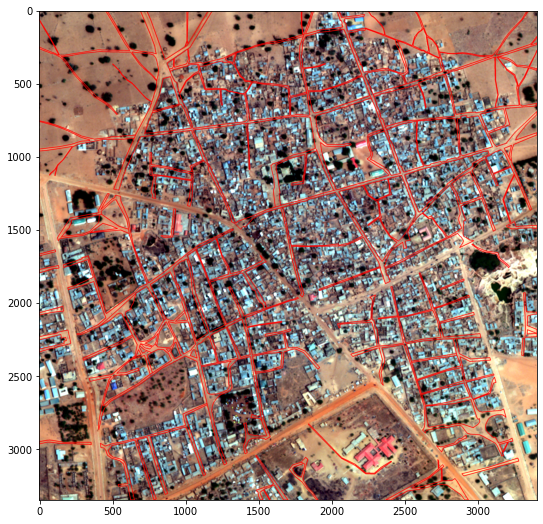

In [31]:
int_vertices=lambda x: np.array(x).round().astype(np.int32)
for poly_id, poly in enumerate(polys):
    #x1,y1,x2,y2 = [int(pb) for pb in poly.bounds]
    xys=int_vertices(poly.exterior.coords) 
    cv2.polylines(x,[xys],True,(255,0,0),3)
    for pi in poly.interiors:
        ixys=int_vertices(pi.coords)
        cv2.polylines(x,[ixys],True,(255,0,0),3)



fig, ax = plt.subplots(figsize=(9,9))
ax.imshow(x)

### Panchromatic sharpening 

In [36]:
from skimage.transform import rescale
import skimage.color as color

IM_ID = '6120_2_2'
m = tiff.imread('/content/Data-set/sixteen_band/{}_M.tif'.format(IM_ID))
pan = tiff.imread('/content/Data-set/sixteen_band/{}_P.tif'.format(IM_ID))

print ('m_shape: ', m.shape)
print ('pan_shape: ', pan.shape)

m_shape:  (8, 837, 851)
pan_shape:  (3348, 3403)


In [41]:
# functions 
def stretch(bands, lower_percent=2, higher_percent=98):
    out = np.zeros_like(bands)
    for i in range(3):
        a = 0 
        b = 255 
        c = np.percentile(bands[:,:,i], lower_percent)
        d = np.percentile(bands[:,:,i], higher_percent)        
        t = a + (bands[:,:,i] - c) * (b - a) / (d - c)    
        t[t<a] = a
        t[t>b] = b
        out[:,:,i] =t
    return out.astype(np.uint8)

def pansharpen(m, pan, method='browley', W=0.1, all_data=False):
    
    # get m_bands
    rgbn = np.empty((m.shape[1], m.shape[2], 4)) 
    rgbn[:,:,0] = m[4,:,:] # red
    rgbn[:,:,1] = m[2,:,:] # green
    rgbn[:,:,2] = m[1,:,:] # blue
    rgbn[:,:,3] = m[6,:,:] # NIR-1
    
    # scaled them
    rgbn_scaled = np.empty((m.shape[1]*4, m.shape[2]*4, 4))

    for i in range(4):
        img = rgbn[:,:,i]
        scaled = rescale(img, (4,4))
        rgbn_scaled[:,:,i] = scaled
    
    # check size and crop for pan band
    if pan.shape[0] < rgbn_scaled.shape[0]:
        rgbn_scaled = rgbn_scaled[:pan.shape[0],:, :]
    else:
        pan = pan[:rgbn_scaled.shape[0], :]
        
    if pan.shape[1] < rgbn_scaled.shape[1]:
        rgbn_scaled = rgbn_scaled[:,:pan.shape[1], :]
    else:
        pan = pan[:,:rgbn_scaled.shape[1]]

    R = rgbn_scaled[:,:,0]
    G = rgbn_scaled[:,:,1]
    B = rgbn_scaled[:,:,2]
    I = rgbn_scaled[:,:,3]

    image = None

    if method == 'simple_browley':
        all_in = R+G+B
        prod = np.multiply(all_in, pan)

        r = np.multiply(R, pan/all_in)[:, :, np.newaxis]
        g = np.multiply(G, pan/all_in)[:, :, np.newaxis]
        b = np.multiply(B, pan/all_in)[:, :, np.newaxis]

        image = np.concatenate([r,g,b], axis=2)
    
    if method == 'sample_mean':
        r = 0.5 * (R + pan)[:, :, np.newaxis]
        g = 0.5 * (G + pan)[:, :, np.newaxis]
        b = 0.5 * (B + pan)[:, :, np.newaxis]
        
        image = np.concatenate([r,g,b], axis=2)
        
    if method == 'esri':
        ADJ = pan-rgbn_scaled.mean(axis=2) 
        r = (R + ADJ)[:, :, np.newaxis]
        g = (G + ADJ)[:, :, np.newaxis]
        b = (B + ADJ)[:, :, np.newaxis]
        i = (I + ADJ)[:, :, np.newaxis]
        
        image = np.concatenate([r,g,b,i], axis=2)
    
    if method == 'browley':
        DNF = (pan - W*I)/(W*R+W*G+W*B)

        r = (R * DNF)[:, :, np.newaxis]
        g = (G * DNF)[:, :, np.newaxis]
        b = (B * DNF)[:, :, np.newaxis]
        i = (I * DNF)[:, :, np.newaxis]

        image = np.concatenate([r,g,b,i], axis=2)
    
    if method == 'hsv':
        hsv = color.rgb2hsv(rgbn_scaled[:,:,:3])
        hsv[:,:,2] = pan - I*W
        image = color.hsv2rgb(hsv)
        
    if all_data:
        return rgbn_scaled, image, I
    else:
        return image

In [42]:
rgbn, sharpened_browley_simple, I = pansharpen(m, pan, method='simple_browley', all_data=True)
sharpened_mean = pansharpen(m, pan, method='sample_mean')
sharpened_esri = pansharpen(m, pan, method='esri')

sharpened_browley2 = pansharpen(m, pan, W=0.1)
sharpened_browley4 = pansharpen(m, pan, W=0.2)
sharpened_browley6 = pansharpen(m, pan, W=0.3)
sharpened_browley8 = pansharpen(m, pan, W=0.4)

sharpened_ihs2 = pansharpen(m, pan, method='hsv', W=0.1)
sharpened_ihs4 = pansharpen(m, pan, method='hsv', W=0.2)
sharpened_ihs6 = pansharpen(m, pan, method='hsv', W=0.3)
sharpened_ihs8 = pansharpen(m, pan, method='hsv', W=0.4)


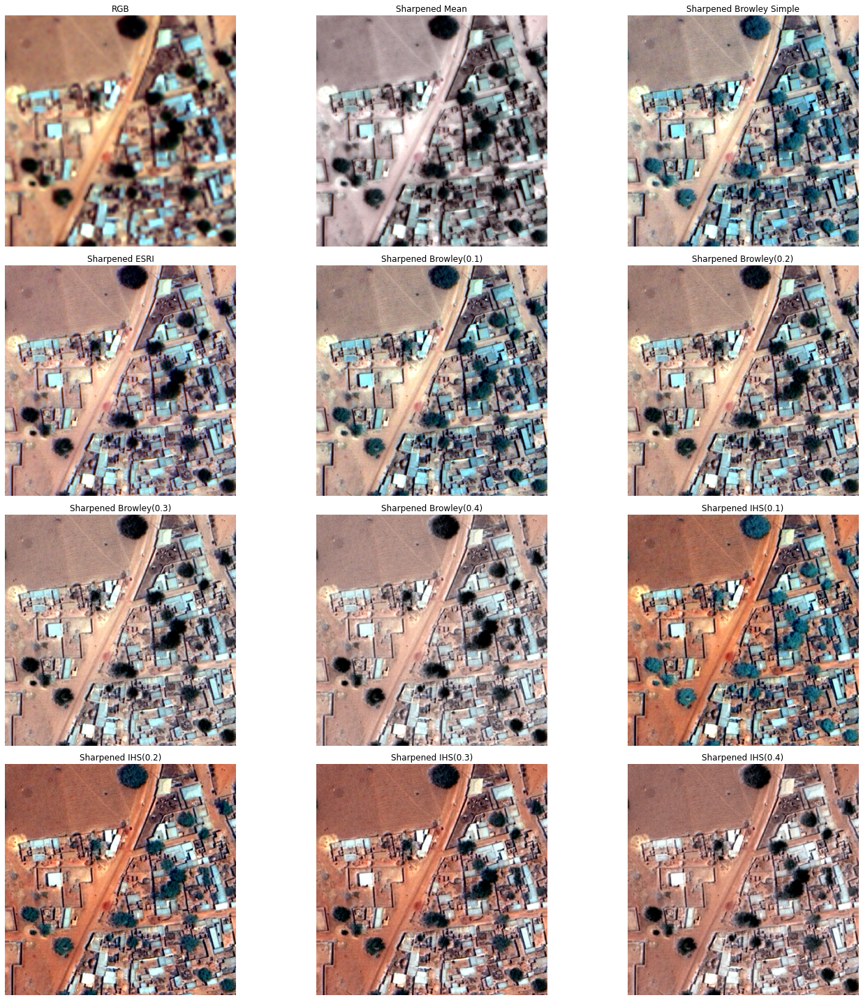

In [43]:
fig, axes = plt.subplots(ncols=3, nrows=4, figsize=(20, 20))
ax = axes.ravel()

# no IR sharpening
ax[0].imshow(stretch(rgbn[500:1000,500:1000,:3]))
ax[0].set_title('RGB')
ax[0].axis('off')
ax[1].imshow(stretch(sharpened_mean[500:1000,500:1000,:]))
ax[1].set_title('Sharpened Mean')    
ax[1].axis('off')
ax[2].imshow(stretch(sharpened_browley_simple[500:1000,500:1000,:]))
ax[2].set_title('Sharpened Browley Simple')
ax[2].axis('off')
ax[3].imshow(stretch(sharpened_esri[500:1000,500:1000,:3]))
ax[3].set_title('Sharpened ESRI')
ax[3].axis('off')

# IR Browley
ax[4].imshow(stretch(sharpened_browley2[500:1000,500:1000,:3]))
ax[4].set_title('Sharpened Browley(0.1)')
ax[4].axis('off')
ax[5].imshow(stretch(sharpened_browley4[500:1000,500:1000,:3]))
ax[5].set_title('Sharpened Browley(0.2)')
ax[5].axis('off')
ax[6].imshow(stretch(sharpened_browley6[500:1000,500:1000,:3]))
ax[6].set_title('Sharpened Browley(0.3)')
ax[6].axis('off')
ax[7].imshow(stretch(sharpened_browley8[500:1000,500:1000,:3]))
ax[7].set_title('Sharpened Browley(0.4)')
ax[7].axis('off')

# IR HSV
ax[8].imshow(stretch(sharpened_ihs2[500:1000,500:1000,:3]))
ax[8].set_title('Sharpened IHS(0.1)')
ax[8].axis('off')
ax[9].imshow(stretch(sharpened_ihs4[500:1000,500:1000,:3]))
ax[9].set_title('Sharpened IHS(0.2)')
ax[9].axis('off')
ax[10].imshow(stretch(sharpened_ihs6[500:1000,500:1000,:3]))
ax[10].set_title('Sharpened IHS(0.3)')
ax[10].axis('off')
ax[11].imshow(stretch(sharpened_ihs8[500:1000,500:1000,:3]))
ax[11].set_title('Sharpened IHS(0.4)')
ax[11].axis('off')

plt.tight_layout()
plt.show()

### Detecting objets

#### Trees and Buildings

In [44]:
from skimage.segmentation import slic, mark_boundaries
import cv2


def stretch_8bit(bands, lower_percent=2, higher_percent=98):
    out = np.zeros_like(bands)
    for i in range(3):
        a = 0 #np.min(band)
        b = 255  #np.max(band)
        c = np.percentile(bands[:,:,i], lower_percent)
        d = np.percentile(bands[:,:,i], higher_percent)        
        t = a + (bands[:,:,i] - c) * (b - a) / (d - c)    
        t[t<a] = a
        t[t>b] = b
        out[:,:,i] =t
    return out.astype(np.uint8)    

In [47]:
def RGB(image_id):
    filename = os.path.join('/content/Data-set/three_band', '{}.tif'.format(image_id))
    img = tiff.imread(filename)
    img = np.rollaxis(img, 0, 3)    
    return img
    
def M(image_id):
    filename = os.path.join('/content/Data-set/sixteen_band', '{}_M.tif'.format(image_id))
    img = tiff.imread(filename)    
    img = np.rollaxis(img, 0, 3)
    return img

In [48]:
image_id = '6120_2_2'
rgb = RGB(image_id)
rgb1 = stretch_8bit(rgb)


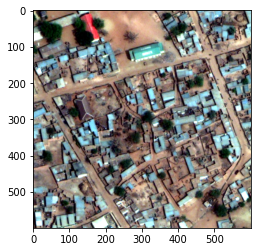

In [50]:
# area of intrest    
y1,y2,x1,x2 = 1000, 1600, 2000, 2600
region = rgb1[y1:y2, x1:x2, :]
plt.figure()
plt.imshow(region)

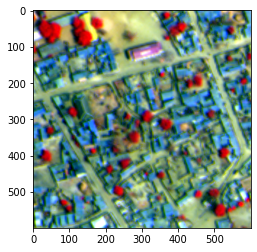

In [51]:
m = M(image_id)    
m = cv2.resize(m, tuple(reversed(rgb.shape[:2])))
    
img = np.zeros_like(rgb)
img[:,:,0] = m[:,:,6] #nir1
img[:,:,1] = m[:,:,4] #red
img[:,:,2] = rgb[:,:,2] #blue
img = stretch_8bit(img)
region = img[y1:y2, x1:x2, :]
plt.figure()
plt.imshow(region)


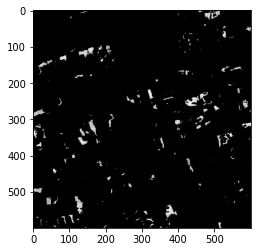

In [52]:
blue_mask = cv2.inRange(region, np.array([15,115,200]), np.array([80,200,255]))    
mask = cv2.bitwise_and(region, region, mask=blue_mask)
mask = cv2.cvtColor(mask, cv2.COLOR_RGB2GRAY)    
plt.figure()
plt.imshow(mask, cmap='gray')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


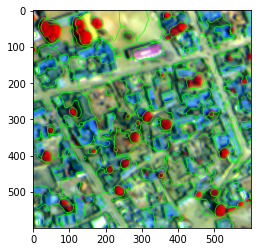

In [53]:
segments = slic(region, n_segments=100, compactness=20.0, 
                    max_iter=10, sigma=5, spacing=None, multichannel=True, 
                    convert2lab=True, enforce_connectivity=False, 
                    min_size_factor=10, max_size_factor=3, slic_zero=False)
boundaries = mark_boundaries(region, segments, color=(0,255,0))
plt.figure()
plt.imshow(boundaries)

789 3545
462 2031
814 3414
573 5184
409 1694
1302 4131
691 2727
1028 3878
539 2506
520 3230
744 3100
636 2181


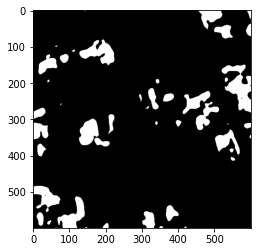

In [54]:
out = np.zeros_like(mask)
for i in range(np.max(segments)):
  s = segments == i
  s_size = np.sum(s)
  s_count = np.sum([1 for x in mask[s].ravel() if x>0])
  if s_count > 0.1*s_size:
    print(s_count, s_size)
    out[s] = 255
        
plt.figure()
plt.imshow(out, cmap='gray')
    

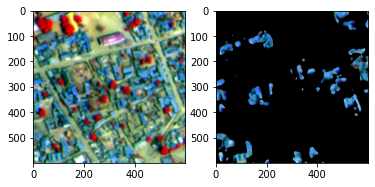

In [55]:
out2 = cv2.bitwise_and(region, region, mask=out)
fig, ax = plt.subplots(1, 2)
ax[0].imshow(region)
ax[1].imshow(out2)

The building are Blue and rees are Red

#### Detecting water ways

In [58]:
from __future__ import division
import numpy as np
import tifffile as tiff
import matplotlib.pyplot as plt
%matplotlib inline
from skimage.transform import resize
from collections import defaultdict
import pandas as pd
import cv2
import os
import shapely
from shapely.geometry import MultiPolygon, Polygon

In [59]:
def stretch_8bit(bands, lower_percent=2, higher_percent=98):
    out = np.zeros_like(bands).astype(np.float32)
    for i in range(3):
        a = 0 
        b = 1 
        c = np.percentile(bands[:,:,i], lower_percent)
        d = np.percentile(bands[:,:,i], higher_percent)        
        t = a + (bands[:,:,i] - c) * (b - a) / (d - c)    
        t[t<a] = a
        t[t>b] = b
        out[:,:,i] =t
    return out.astype(np.float32)

def CCCI_index(m, rgb):
    RE  = resize(m[5,:,:], (rgb.shape[0], rgb.shape[1])) 
    MIR = resize(m[7,:,:], (rgb.shape[0], rgb.shape[1])) 
    R = rgb[:,:,0]
    # canopy chloropyll content index
    CCCI = (MIR-RE)/(MIR+RE)*(MIR-R)/(MIR+R)
    return CCCI    

In [60]:
data = pd.read_csv('/content/Data-set/train_wkt_v4.csv')
data = data[data.MultipolygonWKT != 'MULTIPOLYGON EMPTY']
grid_sizes_fname = '/content/Data-set/grid_sizes.csv'
wkt_fname = '/content/Data-set/train_wkt_v4.csv'
image_fname = '/content/Data-set/three_band'

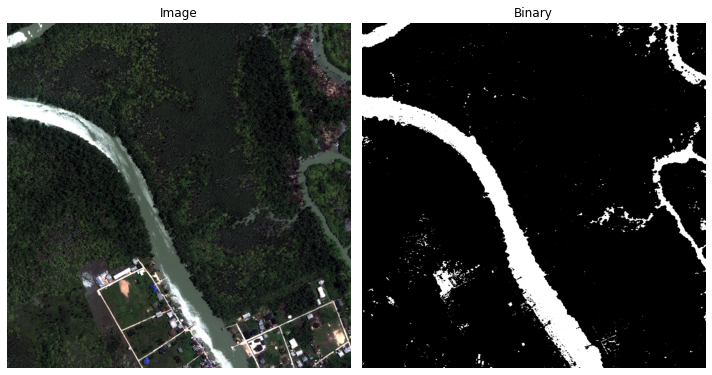

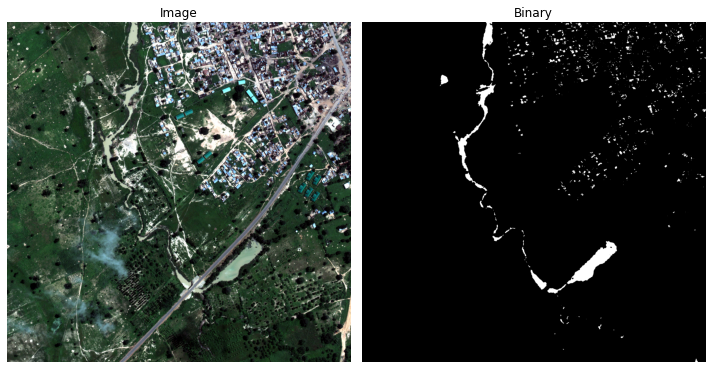

In [61]:
for IM_ID in data[data.ClassType == 7].ImageId:
    # read rgb and m bands
    rgb = tiff.imread('/content/Data-set/three_band/{}.tif'.format(IM_ID))
    rgb = np.rollaxis(rgb, 0, 3)
    m = tiff.imread('/content/Data-set/sixteen_band/{}_M.tif'.format(IM_ID))
    
    # get our index
    CCCI = CCCI_index(m, rgb) 
    
    # you can look on histogram and pick your favorite threshold value(0.11 is my best)
    binary = (CCCI > 0.11).astype(np.float32)
    
    fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(10, 10))
    ax = axes.ravel()
    ax[0].imshow(stretch_8bit(rgb))
    ax[0].set_title('Image')
    ax[0].axis('off')
    ax[1].imshow(binary, cmap='binary_r')
    ax[1].set_title('Binary')
    ax[1].axis('off')
    plt.tight_layout()
    plt.show()

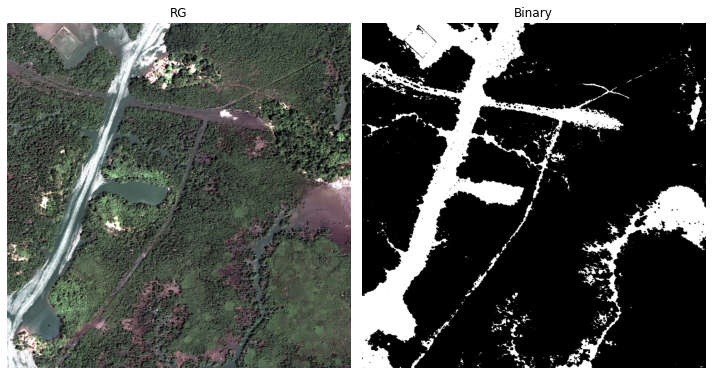

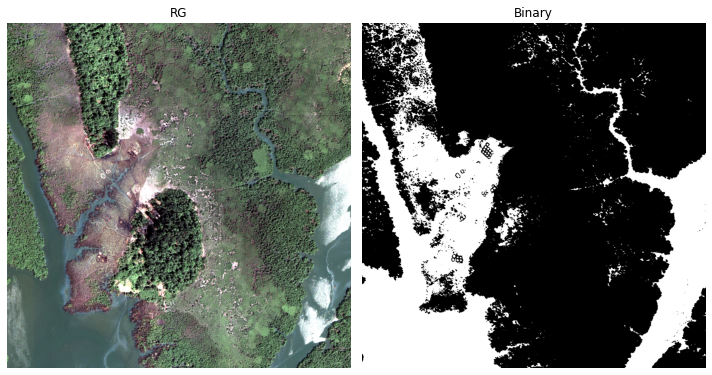

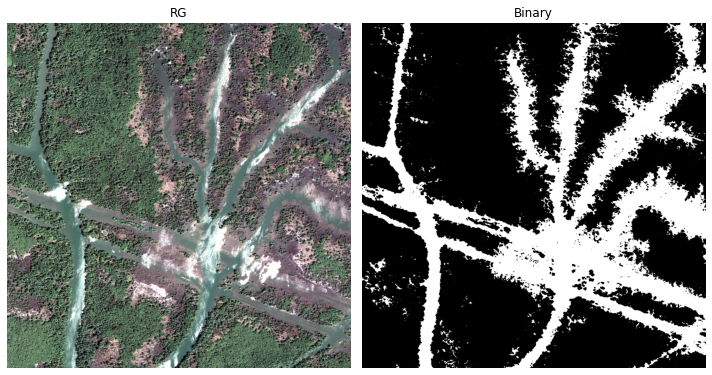

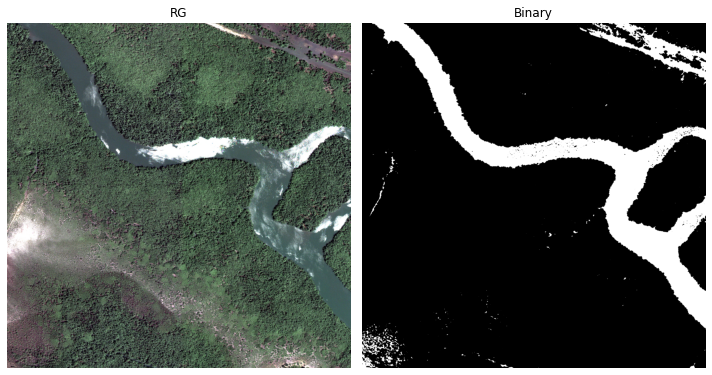

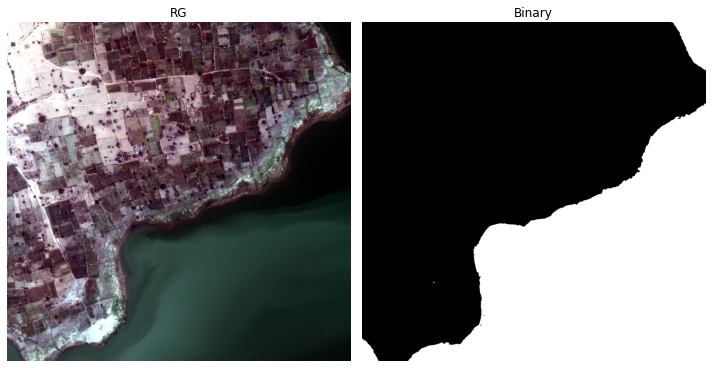

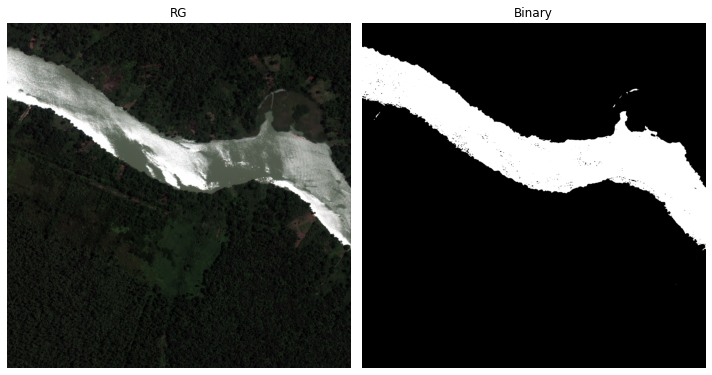

In [62]:
# take some pictures from test 
waterway_test = ['6080_4_3','6080_4_0',
                 '6080_1_3', '6080_1_1',
                 '6150_3_4', '6050_2_1']

for IM_ID in waterway_test:
    # read rgb and m bands
    rgb = tiff.imread('/content/Data-set/three_band/{}.tif'.format(IM_ID))
    rgb = np.rollaxis(rgb, 0, 3)
    m = tiff.imread('/content/Data-set/sixteen_band/{}_M.tif'.format(IM_ID))
    
    # get our index
    CCCI = CCCI_index(m, rgb) 
    
    # you can look on histogram and pick your favorite threshold value(0.11 is my best)
    binary = (CCCI > 0.11).astype(np.float32)
    
    fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(10, 10))
    ax = axes.ravel()
    ax[0].imshow(stretch_8bit(rgb))
    ax[0].set_title('RG')
    ax[0].axis('off')
    ax[1].imshow(binary, cmap='binary_r')
    ax[1].set_title('Binary')
    ax[1].axis('off')
    plt.tight_layout()
    plt.show()


#### Detecting Roads and Dirt Tracks

In [56]:
from PIL import Image

import matplotlib
import tifffile
import json
from matplotlib.collections import PatchCollection

%matplotlib inline

In [66]:
data_dir = '/content/Data-set'
grid_name = '6010_4_2'

# Load grid CSV
grid_sizes = pd.read_csv(os.path.join(data_dir, 'grid_sizes.csv'), index_col=0)
grid_sizes.loc[grid_name]
    
# Load JSON of image overlays
sh_fname = os.path.join(data_dir, 'train_geojson_v3/%s/002_TR_L4_POOR_DIRT_CART_TRACK.geojson'%grid_name)
with open(sh_fname, 'r') as f:
    sh_json = json.load(f)
    
# Load the tif file
im_fname = os.path.join(data_dir, 'three_band','%s.tif'%grid_name)
tif_data = tifffile.imread(im_fname).transpose([1,2,0])

In [70]:
def scale_coords(tif_data, grid_name, point):
    """Scale the coordinates of a polygon into the image coordinates for a grid cell"""
    w,h,_ = tif_data.shape
    Xmax, Ymin = grid_sizes.loc[grid_name][['Xmax', 'Ymin']]
    x,y = point[:,0], point[:,1]

    wp = float(w**2)/(w+1)
    xp = x/Xmax*wp

    hp = float(h**2)/(h+1)
    yp = y/Ymin*hp

    return np.concatenate([xp[:,None],yp[:,None]], axis=1)

def scale_percentile(matrix):
    """Fixes the pixel value range to 2%-98% original distribution of values"""
    orig_shape = matrix.shape
    matrix = np.reshape(matrix, [matrix.shape[0]*matrix.shape[1], 3]).astype(float)
    
    # Get 2nd and 98th percentile
    mins = np.percentile(matrix, 1, axis=0)
    maxs = np.percentile(matrix, 99, axis=0) - mins
    
    matrix = (matrix - mins[None,:])/maxs[None,:]
    matrix = np.reshape(matrix, orig_shape)
    matrix = matrix.clip(0,1)
    return matrix

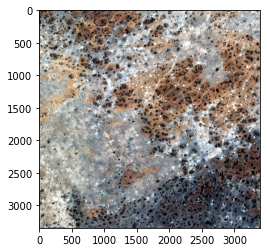

In [71]:
# Show the image with the values scaled from 2-98 percentile to make them visible
fixed_im = scale_percentile(tif_data)
plt.imshow(fixed_im)

In [72]:
# Load JSON of image overlays, and convert it into image coordinates
def load_overlays(tile_name):
    """Get all of the polygon overlays for a tile.
    Returns a dict: {LABEL: POLYGON}"""
    dirname = os.path.join(data_dir, 'train_geojson_v3/%s/'%tile_name)
    fnames = [os.path.join(dirname, fname) for fname in 
              os.listdir(dirname) 
              if fname.endswith('.geojson') and not fname.startswith('Grid')]
    
    overlays = dict()
    for fname in fnames:
        with open(fname, 'r') as f:
            sh_json = json.load(f)
        label = sh_json['features'][0]['properties']['LABEL']
        print(label)
        
        polygons = []
        for sh in sh_json['features']:
            pts = scale_coords(tif_data, grid_name, np.array(sh['geometry']['coordinates'][0])).squeeze()
            
            # Remove badly formatted polygons
            if not ((len(pts.shape)==2) and (pts.shape[1]==2) and (pts.shape[0] > 2)):
                continue
            polygons.append(pts)
            
        overlays[label] = polygons

    return overlays
    
overlays_poly = load_overlays(grid_name)

GROUP_TREES
POOR_DIRT_CART_TRACK
FOOTPATH_TRAIL
STANDALONE_TREES


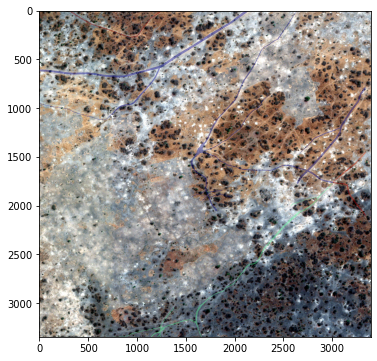

In [73]:
# Put polygons on top of the image

fig, ax = plt.subplots(figsize=(6,6))
patches = []
for pts in overlays_poly['POOR_DIRT_CART_TRACK']:
    
    poly = matplotlib.patches.Polygon(pts)
    patches.append(poly)

p = PatchCollection(patches, cmap=matplotlib.cm.jet, alpha=0.4)

colors = 100*np.random.rand(len(patches))
p.set_array(np.array(colors))

ax.imshow(fixed_im)
ax.add_collection(p)

plt.show()

**These are dirt tracks and roads**
